# Business Analysis

The data was collected through surveys by Kathmandu Living Labs and the Central Bureau of Statistics, which works under the National Planning Commission Secretariat of Nepal. This survey is one of the largest post-disaster datasets ever collected, containing valuable information on earthquake impacts, household conditions, and socio-economic-demographic statistics.


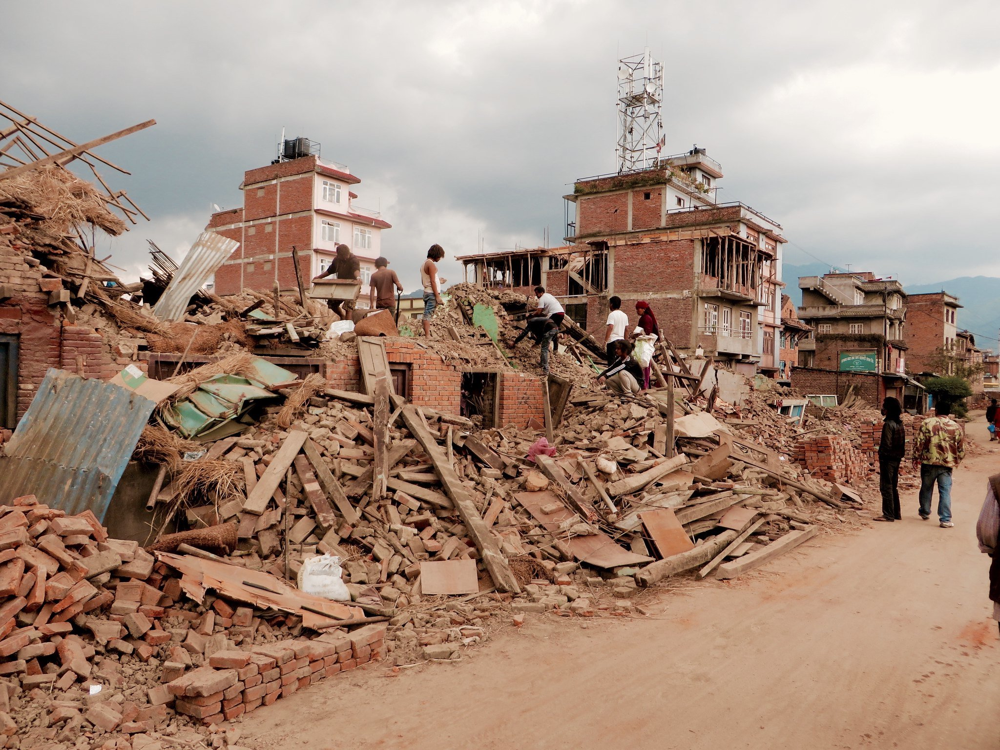


**We're trying to predict the ordinal variable damage_grade, which represents a level of damage to the building that was hit by the earthquake.**

In [1]:
import pandas as pd                      #import all the libeary that are required
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

# 1. Basic Checks & Domain Analysis


In [2]:
data=pd.read_csv('train_values.csv')   # Read the csv file and assign the dataframe a name

In [3]:
data.head()

,building_id,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,land_surface_condition,foundation_type,...,has_secondary_use_agriculture,has_secondary_use_hotel,has_secondary_use_rental,has_secondary_use_institution,has_secondary_use_school,has_secondary_use_industry,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other
0,802906,6,487,12198,2,30,6,5,t,r,...,0,0,0,0,0,0,0,0,0,0
1,28830,8,900,2812,2,10,8,7,o,r,...,0,0,0,0,0,0,0,0,0,0
2,94947,21,363,8973,2,10,5,5,t,r,...,0,0,0,0,0,0,0,0,0,0
3,590882,22,418,10694,2,10,6,5,t,r,...,0,0,0,0,0,0,0,0,0,0
4,201944,11,131,1488,3,30,8,9,t,r,...,0,0,0,0,0,0,0,0,0,0


In [4]:
data.info()     #it gives the information about the datatype,and nulllvalue of the dataset

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 260601 entries, 0 to 260600
Data columns (total 39 columns):
 #   Column                                  Non-Null Count   Dtype 
---  ------                                  --------------   ----- 
 0   building_id                             260601 non-null  int64 
 1   geo_level_1_id                          260601 non-null  int64 
 2   geo_level_2_id                          260601 non-null  int64 
 3   geo_level_3_id                          260601 non-null  int64 
 4   count_floors_pre_eq                     260601 non-null  int64 
 5   age                                     260601 non-null  int64 
 6   area_percentage                         260601 non-null  int64 
 7   height_percentage                       260601 non-null  int64 
 8   land_surface_condition                  260601 non-null  object
 9   foundation_type                         260601 non-null  object
 10  roof_type                               260601 non-null 

In [5]:
data.describe()     #used to view some basic statistical details like percentile, mean, std etc. 

,building_id,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,has_superstructure_adobe_mud,has_superstructure_mud_mortar_stone,...,has_secondary_use_agriculture,has_secondary_use_hotel,has_secondary_use_rental,has_secondary_use_institution,has_secondary_use_school,has_secondary_use_industry,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other
count,2.606010e+05,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,...,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000
mean,5.256755e+05,13.900353,701.074685,6257.876148,2.129723,26.535029,8.018051,5.434365,0.088645,0.761935,...,0.064378,0.033626,0.008101,0.000940,0.000361,0.001071,0.000188,0.000146,0.000088,0.005119
std,3.045450e+05,8.033617,412.710734,3646.369645,0.727665,73.565937,4.392231,1.918418,0.284231,0.425900,...,0.245426,0.180265,0.089638,0.030647,0.018989,0.032703,0.013711,0.012075,0.009394,0.071364
min,4.000000e+00,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,2.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.611900e+05,7.000000,350.000000,3073.000000,2.000000,10.000000,5.000000,4.000000,0.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,5.257570e+05,12.000000,702.000000,6270.000000,2.000000,15.000000,7.000000,5.000000,0.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,7.897620e+05,21.000000,1050.000000,9412.000000,2.000000,30.000000,9.000000,6.000000,0.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.052934e+06,30.000000,1427.000000,12567.000000,9.000000,995.000000,100.000000,32.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [6]:
data.shape         #it shows how many rows and columns are there in the dataset

(260601, 39)

In [7]:
data.describe(include=['O'])    #it gives the statistical information about the catogorical features of the dataset

,land_surface_condition,foundation_type,roof_type,ground_floor_type,other_floor_type,position,plan_configuration,legal_ownership_status
count,260601,260601,260601,260601,260601,260601,260601,260601
unique,3,5,3,5,4,4,10,4
top,t,r,n,f,q,s,d,v
freq,216757,219196,182842,209619,165282,202090,250072,250939


In [8]:
data.head(pd.set_option('display.max_columns',None))#to diplay all columns from dataset


,building_id,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,land_surface_condition,foundation_type,roof_type,ground_floor_type,other_floor_type,position,plan_configuration,has_superstructure_adobe_mud,has_superstructure_mud_mortar_stone,has_superstructure_stone_flag,has_superstructure_cement_mortar_stone,has_superstructure_mud_mortar_brick,has_superstructure_cement_mortar_brick,has_superstructure_timber,has_superstructure_bamboo,has_superstructure_rc_non_engineered,has_superstructure_rc_engineered,has_superstructure_other,legal_ownership_status,count_families,has_secondary_use,has_secondary_use_agriculture,has_secondary_use_hotel,has_secondary_use_rental,has_secondary_use_institution,has_secondary_use_school,has_secondary_use_industry,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other
0,802906,6,487,12198,2,30,6,5,t,r,n,f,q,t,d,1,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0
1,28830,8,900,2812,2,10,8,7,o,r,n,x,q,s,d,0,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0
2,94947,21,363,8973,2,10,5,5,t,r,n,f,x,t,d,0,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0
3,590882,22,418,10694,2,10,6,5,t,r,n,f,x,s,d,0,1,0,0,0,0,1,1,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0
4,201944,11,131,1488,3,30,8,9,t,r,n,f,x,s,d,1,0,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
260596,688636,25,1335,1621,1,55,6,3,n,r,n,f,j,s,q,0,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0
260597,669485,17,715,2060,2,0,6,5,t,r,n,f,q,s,d,0,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0
260598,602512,17,51,8163,3,55,6,7,t,r,q,f,q,s,d,0,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0
260599,151409,26,39,1851,2,10,14,6,t,r,x,v,s,j,d,0,0,0,0,0,1,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0


In [9]:
df=pd.read_csv('train_labels.csv')   #read the target dataset

In [10]:
df.drop('building_id',axis=1,inplace=True)  #drop the id column because there are two of it

In [11]:
df.head()

,damage_grade
0,3
1,2
2,3
3,2
4,3


In [12]:
data=pd.concat([data,df],axis=1)  #merge with the indipendent dataset with dependdent dataset

In [13]:
data.tail()

,building_id,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,land_surface_condition,foundation_type,roof_type,ground_floor_type,other_floor_type,position,plan_configuration,has_superstructure_adobe_mud,has_superstructure_mud_mortar_stone,has_superstructure_stone_flag,has_superstructure_cement_mortar_stone,has_superstructure_mud_mortar_brick,has_superstructure_cement_mortar_brick,has_superstructure_timber,has_superstructure_bamboo,has_superstructure_rc_non_engineered,has_superstructure_rc_engineered,has_superstructure_other,legal_ownership_status,count_families,has_secondary_use,has_secondary_use_agriculture,has_secondary_use_hotel,has_secondary_use_rental,has_secondary_use_institution,has_secondary_use_school,has_secondary_use_industry,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other,damage_grade
260596,688636,25,1335,1621,1,55,6,3,n,r,n,f,j,s,q,0,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,2
260597,669485,17,715,2060,2,0,6,5,t,r,n,f,q,s,d,0,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,3
260598,602512,17,51,8163,3,55,6,7,t,r,q,f,q,s,d,0,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,3
260599,151409,26,39,1851,2,10,14,6,t,r,x,v,s,j,d,0,0,0,0,0,1,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,2
260600,747594,21,9,9101,3,10,7,6,n,r,n,f,q,j,d,0,1,0,0,0,0,0,0,0,0,0,v,3,0,0,0,0,0,0,0,0,0,0,0,3


In [14]:
data.damage_grade.unique() #it shows the independent atributes in the target variable,It is a multi class classification

array([3, 2, 1], dtype=int64)

# Information about dataset


There are 39 columns in this dataset, where the building_id column is a unique and random identifier. The remaining 38 features are described in the section below. Categorical variables have been obfuscated random lowercase ascii characters. The appearance of the same character in distinct columns does not imply the same original value.

### Description of features
1. **geo_level_1_id, geo_level_2_id, geo_level_3_id (type: int):** geographic region in which building exists, from largest (level 1) to most specific sub-region (level 3). Possible values: level 1: 0-30, level 2: 0-1427, level 3: 0-12567.

2. **count_floors_pre_eq (type: int):** number of floors in the building before the earthquake.

3. **age (type: int):** age of the building in years.

4. **area_percentage (type: int):** normalized area of the building footprint.

5. **height_percentage (type: int):** normalized height of the building footprint.

6. **land_surface_condition (type: categorical):** surface condition of the land where the building was built. Possible values: n, o, t.

7. **foundation_type (type: categorical):** type of foundation used while building. Possible values: h, i, r, u, w.

8. **roof_type (type: categorical):** type of roof used while building. Possible values: n, q, x.

9. **ground_floor_type (type: categorical):** type of the ground floor. Possible values: f, m, v, x, z.

10. **other_floor_type (type: categorical):** type of constructions used in higher than the ground floors (except of roof). Possible values: j, q, s, x.

11. **position (type: categorical):** position of the building. Possible values: j, o, s, t.

12. **plan_configuration (type: categorical):** building plan configuration. Possible values: a, c, d, f, m, n, o, q, s, u.

13. **has_superstructure_adobe_mud (type: binary):** flag variable that indicates if the superstructure was made of Adobe/Mud.

14. **has_superstructure_mud_mortar_stone (type: binary):** flag variable that indicates if the superstructure was made of Mud Mortar - Stone.

15. **has_superstructure_mud_mortar_brick (type: binary):** flag variable that indicates if the superstructure was made of Mud Mortar - Brick.

16. **has_superstructure_cement_mortar_brick (type: binary):** flag variable that indicates if the superstructure was made of Cement Mortar - Brick.

17. **has_superstructure_timber (type: binary):** flag variable that indicates if the superstructure was made of Timber.

18. **has_superstructure_bamboo (type: binary):** flag variable that indicates if the superstructure was made of Bamboo.

19. **has_superstructure_rc_non_engineered (type: binary):** flag variable that indicates if the superstructure was made of non-engineered reinforced concrete.

20. **has_superstructure_rc_engineered (type: binary):** flag variable that indicates if the superstructure was made of engineered reinforced concrete.

21. **has_superstructure_other (type: binary):** flag variable that indicates if the superstructure was made of any other material.

22. **legal_ownership_status (type: categorical):** legal ownership status of the land where building was built. Possible values: a, r, v, w.

23. **count_families (type: int):** number of families that live in the building.

24. **has_secondary_use (type: binary):** flag variable that indicates if the building was used for any secondary purpose.

25. **has_secondary_use_agriculture (type: binary):** flag variable that indicates if the building was used for agricultural purposes.

26. **has_secondary_use_hotel (type: binary):** flag variable that indicates if the building was used as a hotel.

27. **has_secondary_use_rental (type: binary):** flag variable that indicates if the building was used for rental purposes.

28. **has_secondary_use_institution (type: binary):** flag variable that indicates if the building was used as a location of any institution.

29. **has_secondary_use_school (type: binary):** flag variable that indicates if the building was used as a school.

30. **has_secondary_use_industry (type: binary):** flag variable that indicates if the building was used for industrial purposes.

31. **has_secondary_use_health_post (type: binary):** flag variable that indicates if the building was used as a health post.

32. **has_secondary_use_gov_office (type: binary):** flag variable that indicates if the building was used fas a government office.

33. **has_secondary_use_use_police (type: binary):** flag variable that indicates if the building was used as a police station.

34. **has_secondary_use_other (type: binary):** flag variable that indicates if the building was secondarily used for other purposes.


# 2. Data Visualization & Ananlysis

### Univariate Analysis

In [15]:
data.columns

Index(['building_id', 'geo_level_1_id', 'geo_level_2_id', 'geo_level_3_id',
       'count_floors_pre_eq', 'age', 'area_percentage', 'height_percentage',
       'land_surface_condition', 'foundation_type', 'roof_type',
       'ground_floor_type', 'other_floor_type', 'position',
       'plan_configuration', 'has_superstructure_adobe_mud',
       'has_superstructure_mud_mortar_stone', 'has_superstructure_stone_flag',
       'has_superstructure_cement_mortar_stone',
       'has_superstructure_mud_mortar_brick',
       'has_superstructure_cement_mortar_brick', 'has_superstructure_timber',
       'has_superstructure_bamboo', 'has_superstructure_rc_non_engineered',
       'has_superstructure_rc_engineered', 'has_superstructure_other',
       'legal_ownership_status', 'count_families', 'has_secondary_use',
       'has_secondary_use_agriculture', 'has_secondary_use_hotel',
       'has_secondary_use_rental', 'has_secondary_use_institution',
       'has_secondary_use_school', 'has_secondary_use_i

In [16]:
data.drop('building_id',axis=1,inplace=True)  #id is a unique feaure no need of it while in ml

In [17]:
data.head()

,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,land_surface_condition,foundation_type,roof_type,ground_floor_type,other_floor_type,position,plan_configuration,has_superstructure_adobe_mud,has_superstructure_mud_mortar_stone,has_superstructure_stone_flag,has_superstructure_cement_mortar_stone,has_superstructure_mud_mortar_brick,has_superstructure_cement_mortar_brick,has_superstructure_timber,has_superstructure_bamboo,has_superstructure_rc_non_engineered,has_superstructure_rc_engineered,has_superstructure_other,legal_ownership_status,count_families,has_secondary_use,has_secondary_use_agriculture,has_secondary_use_hotel,has_secondary_use_rental,has_secondary_use_institution,has_secondary_use_school,has_secondary_use_industry,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other,damage_grade
0,6,487,12198,2,30,6,5,t,r,n,f,q,t,d,1,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,3
1,8,900,2812,2,10,8,7,o,r,n,x,q,s,d,0,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,2
2,21,363,8973,2,10,5,5,t,r,n,f,x,t,d,0,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,3
3,22,418,10694,2,10,6,5,t,r,n,f,x,s,d,0,1,0,0,0,0,1,1,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,2
4,11,131,1488,3,30,8,9,t,r,n,f,x,s,d,1,0,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,3


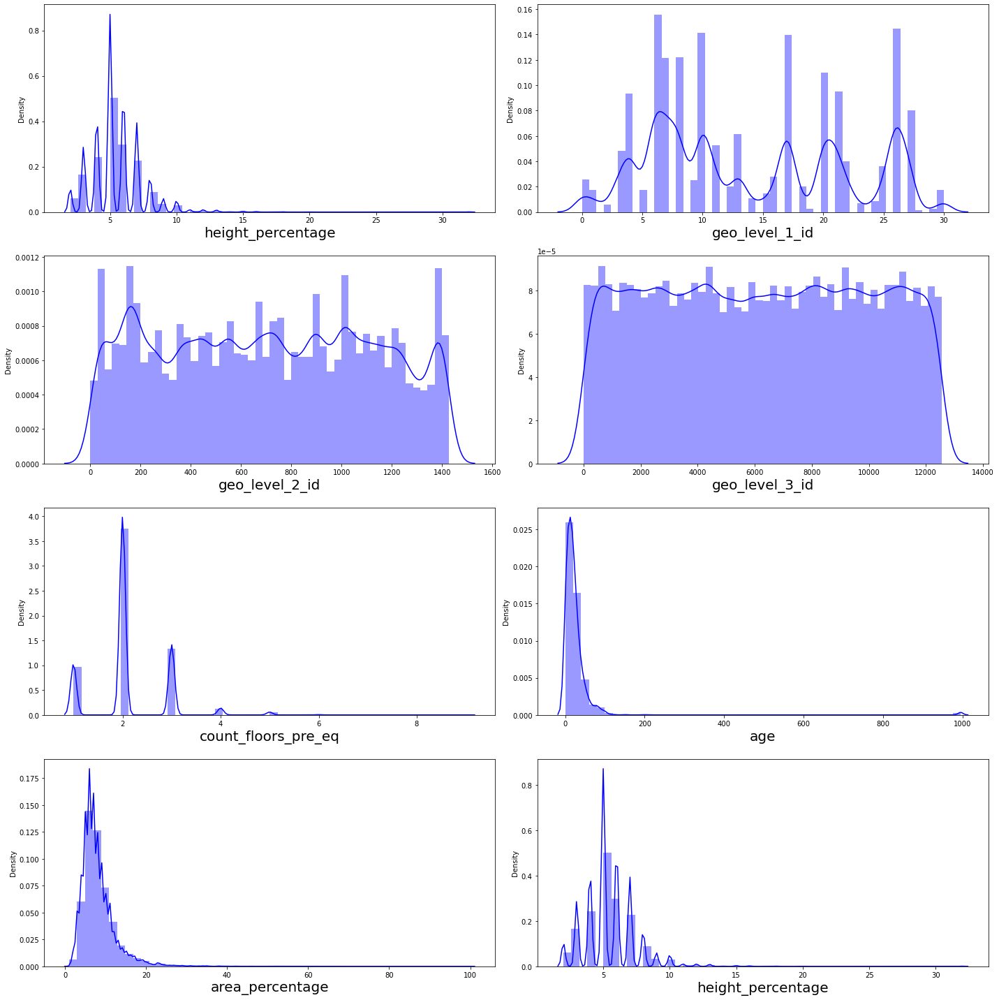

In [18]:
# let's see how data is distributed for every integer columns
#It show the feature of the dataset how much skewed
plt.figure(figsize=(20,20))
data1=data[[ 'height_percentage','geo_level_1_id', 'geo_level_2_id', 'geo_level_3_id',
       'count_floors_pre_eq', 'age', 'area_percentage', 'height_percentage' ]]
plot=1

for column in data1:
    if plot<=8:        # as there are 8 columns in the data
        ax=plt.subplot(4,2,plot)
        sns.distplot(data1[column].dropna(axis=0),color='b')
        plt.xlabel(column,fontsize=20)
    plot+=1
plt.tight_layout()



### Insigts

1. The feature age and area_percentageare skewed.
2. There are many buildings have 2 floors.
3. And geo levels,height percentage are spread accross range but not evenly nor normally.

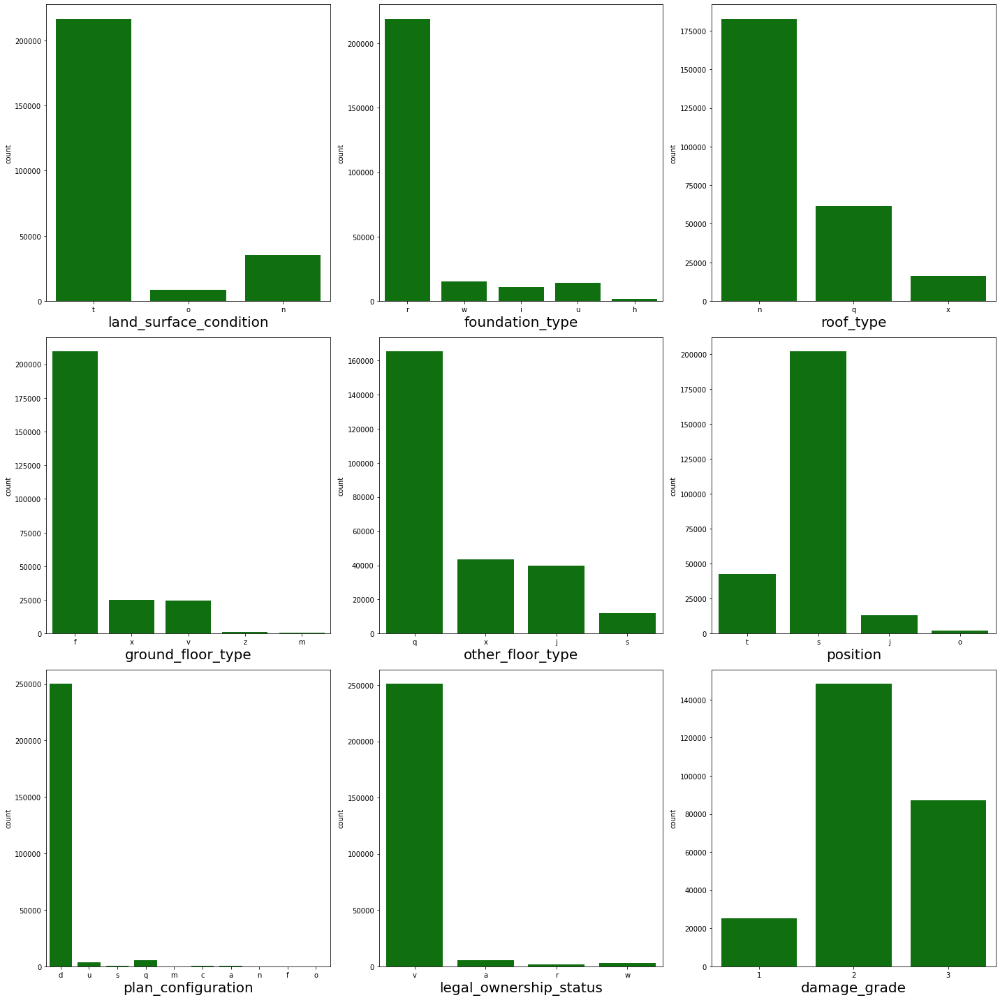

In [19]:
# let's see how data is distributed for every catogorical columns

plt.figure(figsize=(20,20))       #canvas size

data2=data[[ 'land_surface_condition', 'foundation_type', 'roof_type',
       'ground_floor_type', 'other_floor_type', 'position',
       'plan_configuration', 
       'legal_ownership_status','damage_grade']]     
plot=1     ##count variable

for column in data2:  #for loop to acess columns form data2
    if plot<=9:  #checking whether count variable is less than 9 or not
        ax=plt.subplot(3,3,plot) #plotting 8 graphs in canvas(3 rows and 3 columns)
        sns.countplot(data2[column].dropna(axis=0),color='g')  #plotting count plot 
        plt.xlabel(column,fontsize=20)   #assigning name to x-axis and increasing it's font
    plot+=1 #increasing counter
plt.tight_layout()

### Insights

1. There are maximum houses are of t-type land surface, r-type foundation type, n-type roof type.
2. Where f-type ground floor, and other q type floor are maximum.
3. Maximum hause position at s-position.
4. There are maximum house are built on d-type plan.
5. And maximum huse ownerships are v-type.
6. There are maximum number houses are damaged mediumly.

### Bivariate Analysis

In [20]:
data.head()

,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,land_surface_condition,foundation_type,roof_type,ground_floor_type,other_floor_type,position,plan_configuration,has_superstructure_adobe_mud,has_superstructure_mud_mortar_stone,has_superstructure_stone_flag,has_superstructure_cement_mortar_stone,has_superstructure_mud_mortar_brick,has_superstructure_cement_mortar_brick,has_superstructure_timber,has_superstructure_bamboo,has_superstructure_rc_non_engineered,has_superstructure_rc_engineered,has_superstructure_other,legal_ownership_status,count_families,has_secondary_use,has_secondary_use_agriculture,has_secondary_use_hotel,has_secondary_use_rental,has_secondary_use_institution,has_secondary_use_school,has_secondary_use_industry,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other,damage_grade
0,6,487,12198,2,30,6,5,t,r,n,f,q,t,d,1,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,3
1,8,900,2812,2,10,8,7,o,r,n,x,q,s,d,0,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,2
2,21,363,8973,2,10,5,5,t,r,n,f,x,t,d,0,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,3
3,22,418,10694,2,10,6,5,t,r,n,f,x,s,d,0,1,0,0,0,0,1,1,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,2
4,11,131,1488,3,30,8,9,t,r,n,f,x,s,d,1,0,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,3


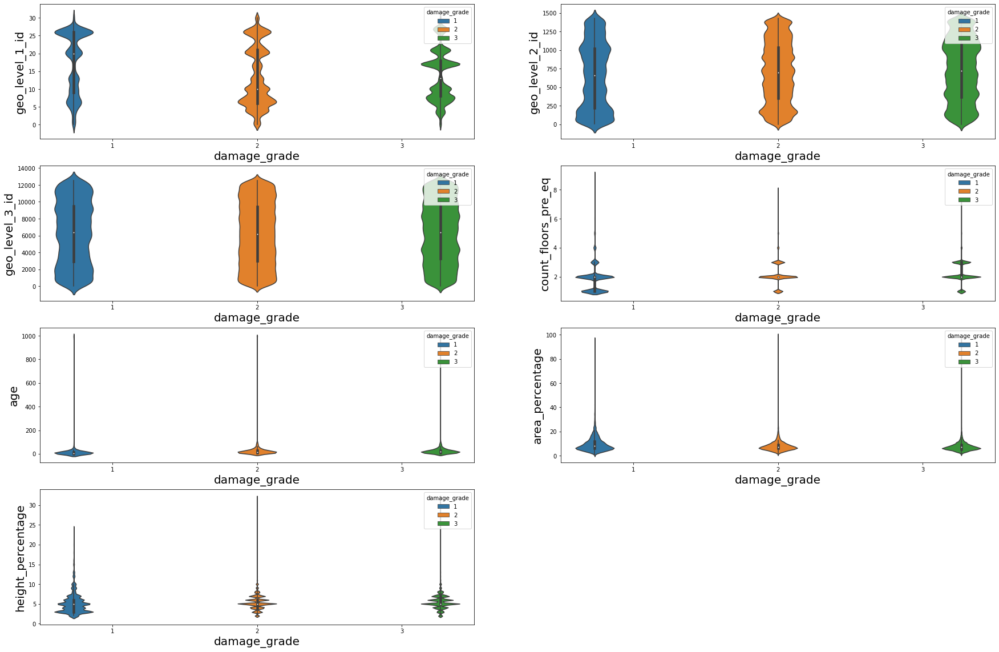

In [21]:
# Here using volin plot for checking the features impacted by the target variable
plt.figure(figsize=(30,20))
data1=data[[ 'geo_level_1_id', 'geo_level_2_id', 'geo_level_3_id',
       'count_floors_pre_eq', 'age', 'area_percentage', 'height_percentage' ]]
plot=1

for column in data1:
    if plot<=8:
        ax=plt.subplot(4,2,plot)
        sns.violinplot(x=data['damage_grade'],y=data1[column].dropna(axis=0),hue=data['damage_grade'])
        plt.xlabel('damage_grade',fontsize=20)
        plt.ylabel(column,fontsize=20)
    plot+=1
plt.tight_layout
plt.show()

### Insights

1. Geo leves are no impact on the level of damage.
2. The hight of floor are impacted by higher damage.
3. The area and height percentage are affected by higher level of damage.
4. Age is neutral.

In [22]:
data.head()

,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,land_surface_condition,foundation_type,roof_type,ground_floor_type,other_floor_type,position,plan_configuration,has_superstructure_adobe_mud,has_superstructure_mud_mortar_stone,has_superstructure_stone_flag,has_superstructure_cement_mortar_stone,has_superstructure_mud_mortar_brick,has_superstructure_cement_mortar_brick,has_superstructure_timber,has_superstructure_bamboo,has_superstructure_rc_non_engineered,has_superstructure_rc_engineered,has_superstructure_other,legal_ownership_status,count_families,has_secondary_use,has_secondary_use_agriculture,has_secondary_use_hotel,has_secondary_use_rental,has_secondary_use_institution,has_secondary_use_school,has_secondary_use_industry,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other,damage_grade
0,6,487,12198,2,30,6,5,t,r,n,f,q,t,d,1,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,3
1,8,900,2812,2,10,8,7,o,r,n,x,q,s,d,0,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,2
2,21,363,8973,2,10,5,5,t,r,n,f,x,t,d,0,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,3
3,22,418,10694,2,10,6,5,t,r,n,f,x,s,d,0,1,0,0,0,0,1,1,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,2
4,11,131,1488,3,30,8,9,t,r,n,f,x,s,d,1,0,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,3


In [23]:
#Analyse binary Features with respect to Damage Grade 

plt.figure(figsize=(100,100))
data3=data[['has_superstructure_adobe_mud',
       'has_superstructure_mud_mortar_stone', 'has_superstructure_stone_flag',
       'has_superstructure_cement_mortar_stone',
       'has_superstructure_mud_mortar_brick',
       'has_superstructure_cement_mortar_brick', 'has_superstructure_timber',
       'has_superstructure_bamboo', 'has_superstructure_rc_non_engineered',
       'has_superstructure_rc_engineered', 'has_superstructure_other',
        'count_families', 'has_secondary_use',
       'has_secondary_use_agriculture', 'has_secondary_use_hotel',
       'has_secondary_use_rental', 'has_secondary_use_institution',
       'has_secondary_use_school', 'has_secondary_use_industry',
       'has_secondary_use_health_post', 'has_secondary_use_gov_office',
       'has_secondary_use_use_police', 'has_secondary_use_other']]
plot=1

for column in data3:
    if plot<=24:
        ax=plt.subplot(8,3,plot)
        sns.countplot(data3[column],hue=data['damage_grade'],palette="viridis")
        plt.xlabel(column,fontsize=20)
        plt.ylabel('damage_grade',fontsize=20)
        plt.title(column+'vs damage_grade',fontweight='bold')
    plot+=1
plt.tight_layout()
plt.show()


**It gives the count of different binary features with respect to the level of damage.**

**Except the buildings are has_superstructure_mud_mortar_stone all other buildings are get hit by earthquack.**

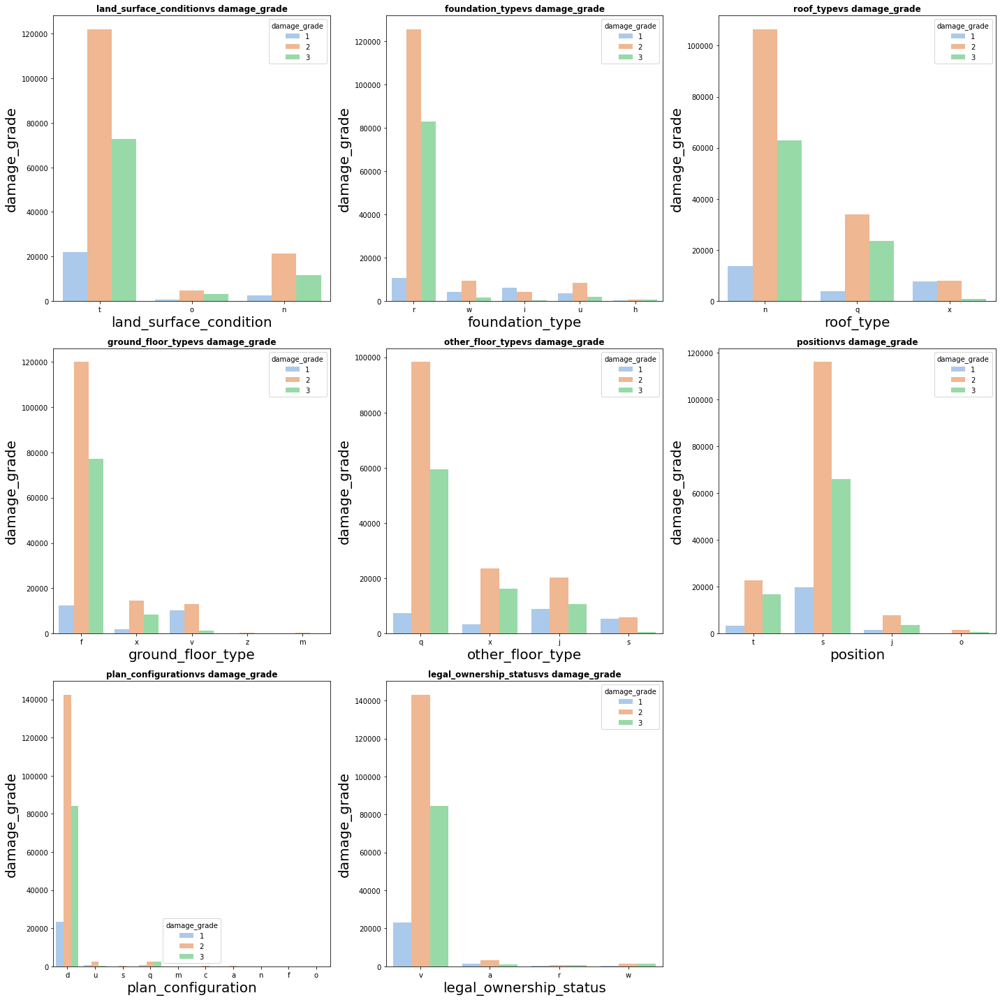

In [24]:
#Analyse Categorical Features with respect to Damage Grade 

plt.figure(figsize=(20,20))

data4=data[[ 'land_surface_condition', 'foundation_type', 'roof_type',
       'ground_floor_type', 'other_floor_type', 'position',
       'plan_configuration', 
       'legal_ownership_status']]
plot=1

for column in data4:
    if plot<=9:
        ax=plt.subplot(3,3,plot)
        sns.countplot(data4[column].dropna(axis=0),hue=data['damage_grade'],palette='pastel')
        plt.xlabel(column,fontsize=20)
        plt.ylabel('damage_grade',fontsize=20)
        plt.title(column+'vs damage_grade',fontweight='bold')
    plot+=1
plt.tight_layout()

**It shows the relationship between catogorical feature with the target variables.**

<Figure size 7200x7200 with 0 Axes>

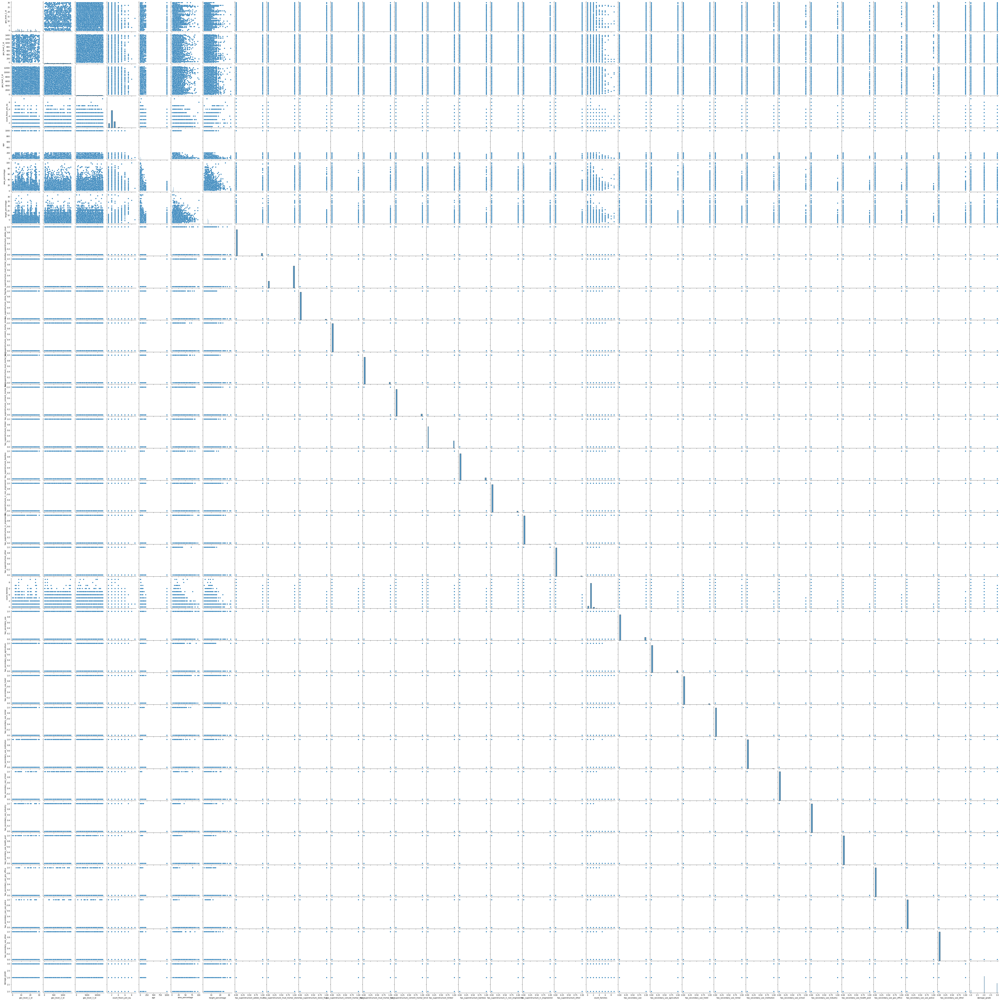

In [25]:
plt.figure(figsize=(100,100))  #it gives the relationship between the every feature with the every other feature
sns.pairplot(data)
plt.show()

# 3. Data Pre-processing/Feature Engineering

### Handling missing value

In [26]:
data.isnull().sum()#null value checking 
# no null values

geo_level_1_id                            0
geo_level_2_id                            0
geo_level_3_id                            0
count_floors_pre_eq                       0
age                                       0
area_percentage                           0
height_percentage                         0
land_surface_condition                    0
foundation_type                           0
roof_type                                 0
ground_floor_type                         0
other_floor_type                          0
position                                  0
plan_configuration                        0
has_superstructure_adobe_mud              0
has_superstructure_mud_mortar_stone       0
has_superstructure_stone_flag             0
has_superstructure_cement_mortar_stone    0
has_superstructure_mud_mortar_brick       0
has_superstructure_cement_mortar_brick    0
has_superstructure_timber                 0
has_superstructure_bamboo                 0
has_superstructure_rc_non_engine

# Removing Duplicate Values

In [27]:
data.head()  

,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,land_surface_condition,foundation_type,roof_type,ground_floor_type,other_floor_type,position,plan_configuration,has_superstructure_adobe_mud,has_superstructure_mud_mortar_stone,has_superstructure_stone_flag,has_superstructure_cement_mortar_stone,has_superstructure_mud_mortar_brick,has_superstructure_cement_mortar_brick,has_superstructure_timber,has_superstructure_bamboo,has_superstructure_rc_non_engineered,has_superstructure_rc_engineered,has_superstructure_other,legal_ownership_status,count_families,has_secondary_use,has_secondary_use_agriculture,has_secondary_use_hotel,has_secondary_use_rental,has_secondary_use_institution,has_secondary_use_school,has_secondary_use_industry,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other,damage_grade
0,6,487,12198,2,30,6,5,t,r,n,f,q,t,d,1,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,3
1,8,900,2812,2,10,8,7,o,r,n,x,q,s,d,0,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,2
2,21,363,8973,2,10,5,5,t,r,n,f,x,t,d,0,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,3
3,22,418,10694,2,10,6,5,t,r,n,f,x,s,d,0,1,0,0,0,0,1,1,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,2
4,11,131,1488,3,30,8,9,t,r,n,f,x,s,d,1,0,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,3


In [28]:
data.loc[data.duplicated()] #Checking for duplicate values

,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,land_surface_condition,foundation_type,roof_type,ground_floor_type,other_floor_type,position,plan_configuration,has_superstructure_adobe_mud,has_superstructure_mud_mortar_stone,has_superstructure_stone_flag,has_superstructure_cement_mortar_stone,has_superstructure_mud_mortar_brick,has_superstructure_cement_mortar_brick,has_superstructure_timber,has_superstructure_bamboo,has_superstructure_rc_non_engineered,has_superstructure_rc_engineered,has_superstructure_other,legal_ownership_status,count_families,has_secondary_use,has_secondary_use_agriculture,has_secondary_use_hotel,has_secondary_use_rental,has_secondary_use_institution,has_secondary_use_school,has_secondary_use_industry,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other,damage_grade
2702,20,508,11256,2,10,9,6,t,w,q,f,x,s,d,0,0,0,0,0,0,1,1,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,1
3003,21,111,11714,2,10,9,5,t,r,q,f,q,s,d,0,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,3
3563,6,1108,5909,2,30,4,7,t,r,n,f,q,s,d,1,0,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,2
4188,27,269,11121,2,15,10,7,n,r,n,f,x,s,d,0,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,3
4937,10,1382,5036,2,15,5,5,t,r,n,f,q,s,d,0,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
260546,10,90,10884,2,20,5,5,t,r,q,f,q,s,d,0,1,0,0,0,0,1,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,2
260575,4,144,5751,2,5,4,4,t,r,q,x,q,s,d,0,1,0,0,0,0,1,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,2
260580,17,875,10462,2,5,6,5,t,r,n,f,q,s,d,0,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,3
260583,7,322,2843,2,10,6,6,t,r,n,f,q,s,d,1,1,0,0,0,0,1,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,2


In [29]:
data.duplicated().sum() #total no of duplicate values

12319

In [30]:
data.drop_duplicates()   #drop the duplicate values

,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,land_surface_condition,foundation_type,roof_type,ground_floor_type,other_floor_type,position,plan_configuration,has_superstructure_adobe_mud,has_superstructure_mud_mortar_stone,has_superstructure_stone_flag,has_superstructure_cement_mortar_stone,has_superstructure_mud_mortar_brick,has_superstructure_cement_mortar_brick,has_superstructure_timber,has_superstructure_bamboo,has_superstructure_rc_non_engineered,has_superstructure_rc_engineered,has_superstructure_other,legal_ownership_status,count_families,has_secondary_use,has_secondary_use_agriculture,has_secondary_use_hotel,has_secondary_use_rental,has_secondary_use_institution,has_secondary_use_school,has_secondary_use_industry,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other,damage_grade
0,6,487,12198,2,30,6,5,t,r,n,f,q,t,d,1,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,3
1,8,900,2812,2,10,8,7,o,r,n,x,q,s,d,0,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,2
2,21,363,8973,2,10,5,5,t,r,n,f,x,t,d,0,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,3
3,22,418,10694,2,10,6,5,t,r,n,f,x,s,d,0,1,0,0,0,0,1,1,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,2
4,11,131,1488,3,30,8,9,t,r,n,f,x,s,d,1,0,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
260596,25,1335,1621,1,55,6,3,n,r,n,f,j,s,q,0,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,2
260597,17,715,2060,2,0,6,5,t,r,n,f,q,s,d,0,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,3
260598,17,51,8163,3,55,6,7,t,r,q,f,q,s,d,0,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,3
260599,26,39,1851,2,10,14,6,t,r,x,v,s,j,d,0,0,0,0,0,1,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,2


In [31]:
data.head()

,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,land_surface_condition,foundation_type,roof_type,ground_floor_type,other_floor_type,position,plan_configuration,has_superstructure_adobe_mud,has_superstructure_mud_mortar_stone,has_superstructure_stone_flag,has_superstructure_cement_mortar_stone,has_superstructure_mud_mortar_brick,has_superstructure_cement_mortar_brick,has_superstructure_timber,has_superstructure_bamboo,has_superstructure_rc_non_engineered,has_superstructure_rc_engineered,has_superstructure_other,legal_ownership_status,count_families,has_secondary_use,has_secondary_use_agriculture,has_secondary_use_hotel,has_secondary_use_rental,has_secondary_use_institution,has_secondary_use_school,has_secondary_use_industry,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other,damage_grade
0,6,487,12198,2,30,6,5,t,r,n,f,q,t,d,1,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,3
1,8,900,2812,2,10,8,7,o,r,n,x,q,s,d,0,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,2
2,21,363,8973,2,10,5,5,t,r,n,f,x,t,d,0,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,3
3,22,418,10694,2,10,6,5,t,r,n,f,x,s,d,0,1,0,0,0,0,1,1,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,2
4,11,131,1488,3,30,8,9,t,r,n,f,x,s,d,1,0,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,3


# Convert categorical feature to numerical feature


In [32]:
data.head() ## Categorical data conversion

,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,land_surface_condition,foundation_type,roof_type,ground_floor_type,other_floor_type,position,plan_configuration,has_superstructure_adobe_mud,has_superstructure_mud_mortar_stone,has_superstructure_stone_flag,has_superstructure_cement_mortar_stone,has_superstructure_mud_mortar_brick,has_superstructure_cement_mortar_brick,has_superstructure_timber,has_superstructure_bamboo,has_superstructure_rc_non_engineered,has_superstructure_rc_engineered,has_superstructure_other,legal_ownership_status,count_families,has_secondary_use,has_secondary_use_agriculture,has_secondary_use_hotel,has_secondary_use_rental,has_secondary_use_institution,has_secondary_use_school,has_secondary_use_industry,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other,damage_grade
0,6,487,12198,2,30,6,5,t,r,n,f,q,t,d,1,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,3
1,8,900,2812,2,10,8,7,o,r,n,x,q,s,d,0,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,2
2,21,363,8973,2,10,5,5,t,r,n,f,x,t,d,0,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,3
3,22,418,10694,2,10,6,5,t,r,n,f,x,s,d,0,1,0,0,0,0,1,1,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,2
4,11,131,1488,3,30,8,9,t,r,n,f,x,s,d,1,0,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,3


In [33]:
#using label encoder for converting catogorical value to numerical values
from sklearn.preprocessing import LabelEncoder   
LE=LabelEncoder()


data['land_surface_condition']=LE.fit_transform(data['land_surface_condition'])
data['foundation_type']=LE.fit_transform(data['foundation_type'])
data['roof_type']=LE.fit_transform(data['roof_type'])
data['ground_floor_type']=LE.fit_transform(data['ground_floor_type'])
data['other_floor_type']=LE.fit_transform(data['other_floor_type'])
data['position']=LE.fit_transform(data['position'])
data['plan_configuration']=LE.fit_transform(data['plan_configuration'])
data['legal_ownership_status']=LE.fit_transform(data['legal_ownership_status'])

In [34]:
data.head()

,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,land_surface_condition,foundation_type,roof_type,ground_floor_type,other_floor_type,position,plan_configuration,has_superstructure_adobe_mud,has_superstructure_mud_mortar_stone,has_superstructure_stone_flag,has_superstructure_cement_mortar_stone,has_superstructure_mud_mortar_brick,has_superstructure_cement_mortar_brick,has_superstructure_timber,has_superstructure_bamboo,has_superstructure_rc_non_engineered,has_superstructure_rc_engineered,has_superstructure_other,legal_ownership_status,count_families,has_secondary_use,has_secondary_use_agriculture,has_secondary_use_hotel,has_secondary_use_rental,has_secondary_use_institution,has_secondary_use_school,has_secondary_use_industry,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other,damage_grade
0,6,487,12198,2,30,6,5,2,2,0,0,1,3,2,1,1,0,0,0,0,0,0,0,0,0,2,1,0,0,0,0,0,0,0,0,0,0,0,3
1,8,900,2812,2,10,8,7,1,2,0,3,1,2,2,0,1,0,0,0,0,0,0,0,0,0,2,1,0,0,0,0,0,0,0,0,0,0,0,2
2,21,363,8973,2,10,5,5,2,2,0,0,3,3,2,0,1,0,0,0,0,0,0,0,0,0,2,1,0,0,0,0,0,0,0,0,0,0,0,3
3,22,418,10694,2,10,6,5,2,2,0,0,3,2,2,0,1,0,0,0,0,1,1,0,0,0,2,1,0,0,0,0,0,0,0,0,0,0,0,2
4,11,131,1488,3,30,8,9,2,2,0,0,3,2,2,1,0,0,0,0,0,0,0,0,0,0,2,1,0,0,0,0,0,0,0,0,0,0,0,3


# Handling Outliers

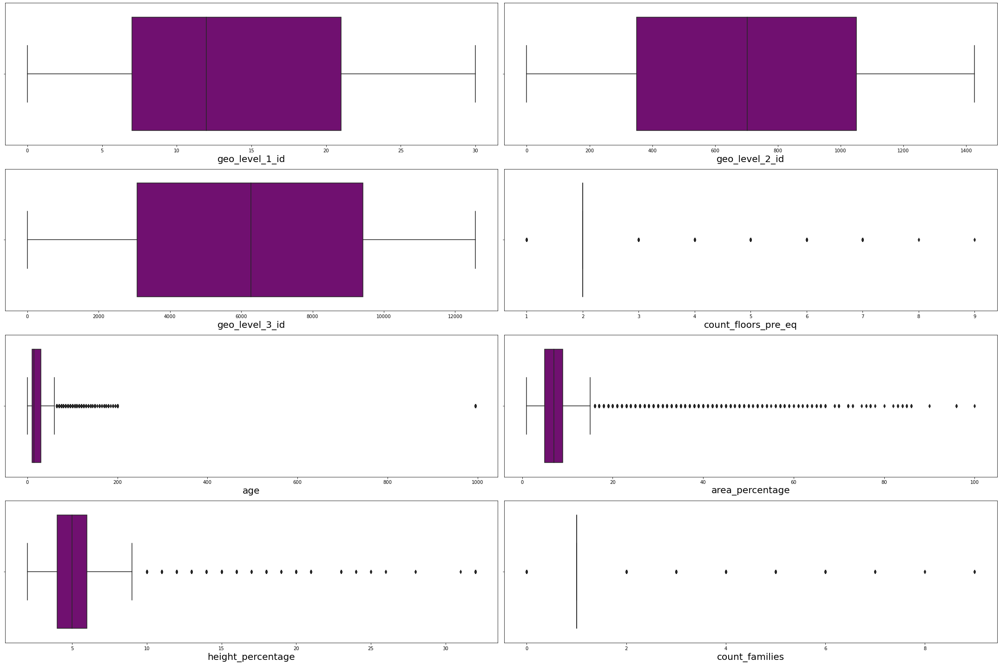

In [35]:
 #Here i am creation function for checking outliers in the dataset
 #And i am going to remove it so that it cant affect my ml model  
plt.figure(figsize=(30,20))
data5=data[[ 'geo_level_1_id', 'geo_level_2_id', 'geo_level_3_id',
       'count_floors_pre_eq', 'age', 'area_percentage', 'height_percentage','count_families']]
plot=1
for column in data5:
    if plot<=8:
        ax=plt.subplot(4,2,plot)
        sns.boxplot(data5[column].dropna(axis=0),color='purple')
        plt.xlabel(column,fontsize=20)
    plot+=1
plt.tight_layout()
plt.show()

In [36]:
from scipy import stats          # Creating a model top remove outliers
def outlier(column,dataset):
    iqr=stats.iqr(dataset[column],interpolation='midpoint')
    q1=dataset[column].quantile(0.25)
    min_range=q1-1.5*iqr
    q3=dataset[column].quantile(0.75)
    max_range=q3+1.5*iqr
    dataset.loc[dataset[column]<min_range,column]=np.median(dataset[column])
    dataset.loc[dataset[column]>max_range,column]=np.median(dataset[column])
    return dataset

In [37]:
data=outlier('count_floors_pre_eq',data)

In [38]:
data=outlier('age',data)  #Revoving all the outliers
data=outlier('area_percentage',data)
data=outlier('height_percentage',data)
data=outlier('count_families',data)

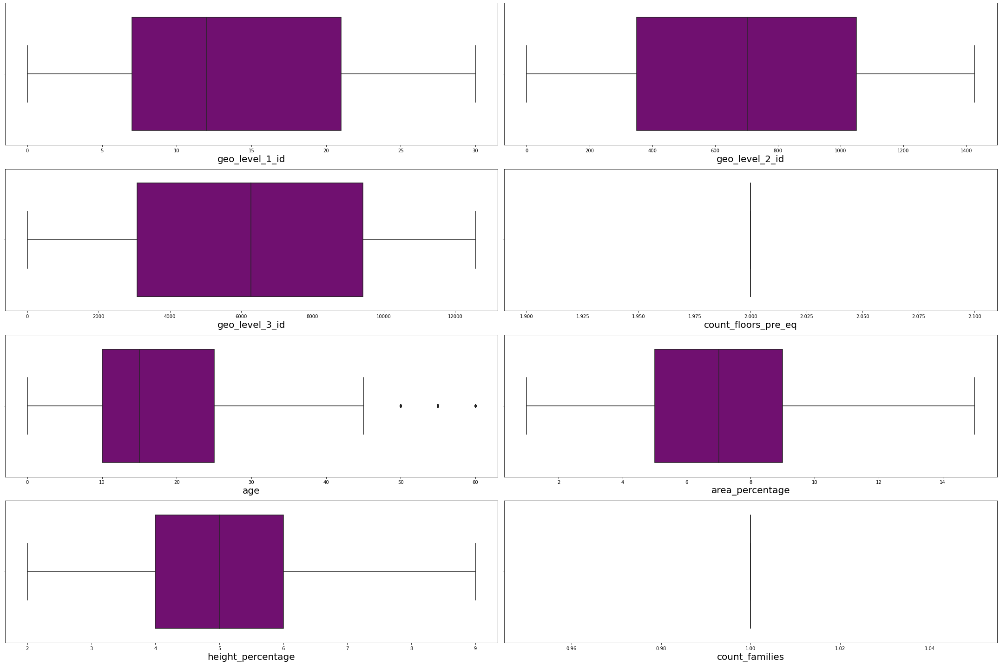

In [39]:
plt.figure(figsize=(30,20))  #checking is the outliers are removed or not
data5=data[[ 'geo_level_1_id', 'geo_level_2_id', 'geo_level_3_id',
       'count_floors_pre_eq', 'age', 'area_percentage', 'height_percentage','count_families']]
plot=1
for column in data5:
    if plot<=8:
        ax=plt.subplot(4,2,plot)
        sns.boxplot(data5[column].dropna(axis=0),color='purple')
        plt.xlabel(column,fontsize=20)
    plot+=1
plt.tight_layout()
plt.show()

# Scaling the data

In [40]:
data.head()

,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,land_surface_condition,foundation_type,roof_type,ground_floor_type,other_floor_type,position,plan_configuration,has_superstructure_adobe_mud,has_superstructure_mud_mortar_stone,has_superstructure_stone_flag,has_superstructure_cement_mortar_stone,has_superstructure_mud_mortar_brick,has_superstructure_cement_mortar_brick,has_superstructure_timber,has_superstructure_bamboo,has_superstructure_rc_non_engineered,has_superstructure_rc_engineered,has_superstructure_other,legal_ownership_status,count_families,has_secondary_use,has_secondary_use_agriculture,has_secondary_use_hotel,has_secondary_use_rental,has_secondary_use_institution,has_secondary_use_school,has_secondary_use_industry,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other,damage_grade
0,6,487,12198,2,30,6,5,2,2,0,0,1,3,2,1,1,0,0,0,0,0,0,0,0,0,2,1,0,0,0,0,0,0,0,0,0,0,0,3
1,8,900,2812,2,10,8,7,1,2,0,3,1,2,2,0,1,0,0,0,0,0,0,0,0,0,2,1,0,0,0,0,0,0,0,0,0,0,0,2
2,21,363,8973,2,10,5,5,2,2,0,0,3,3,2,0,1,0,0,0,0,0,0,0,0,0,2,1,0,0,0,0,0,0,0,0,0,0,0,3
3,22,418,10694,2,10,6,5,2,2,0,0,3,2,2,0,1,0,0,0,0,1,1,0,0,0,2,1,0,0,0,0,0,0,0,0,0,0,0,2
4,11,131,1488,2,30,8,9,2,2,0,0,3,2,2,1,0,0,0,0,0,0,0,0,0,0,2,1,0,0,0,0,0,0,0,0,0,0,0,3


In [41]:
#here i am using standardscaler to convert numerical feature into standard normal distibuted form
#it helps my model to read the data perfectly

from sklearn.preprocessing import StandardScaler
SS=StandardScaler()
data[[ 'height_percentage','geo_level_1_id', 'geo_level_2_id', 'geo_level_3_id',
       'count_floors_pre_eq', 'age', 'area_percentage', 'height_percentage' ]]=SS.fit_transform(data[[ 'height_percentage','geo_level_1_id', 'geo_level_2_id', 'geo_level_3_id',
       'count_floors_pre_eq', 'age', 'area_percentage', 'height_percentage' ]])

In [42]:
data.head()

,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,land_surface_condition,foundation_type,roof_type,ground_floor_type,other_floor_type,position,plan_configuration,has_superstructure_adobe_mud,has_superstructure_mud_mortar_stone,has_superstructure_stone_flag,has_superstructure_cement_mortar_stone,has_superstructure_mud_mortar_brick,has_superstructure_cement_mortar_brick,has_superstructure_timber,has_superstructure_bamboo,has_superstructure_rc_non_engineered,has_superstructure_rc_engineered,has_superstructure_other,legal_ownership_status,count_families,has_secondary_use,has_secondary_use_agriculture,has_secondary_use_hotel,has_secondary_use_rental,has_secondary_use_institution,has_secondary_use_school,has_secondary_use_industry,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other,damage_grade
0,-0.983414,-0.518705,1.629055,0.0,0.848872,-0.478336,-0.15813,2,2,0,0,1,3,2,1,1,0,0,0,0,0,0,0,0,0,2,1,0,0,0,0,0,0,0,0,0,0,0,3
1,-0.734459,0.481998,-0.945017,0.0,-0.607111,0.261917,1.14957,1,2,0,3,1,2,2,0,1,0,0,0,0,0,0,0,0,0,2,1,0,0,0,0,0,0,0,0,0,0,0,2
2,0.883744,-0.819158,0.744612,0.0,-0.607111,-0.848463,-0.15813,2,2,0,0,3,3,2,0,1,0,0,0,0,0,0,0,0,0,2,1,0,0,0,0,0,0,0,0,0,0,0,3
3,1.008221,-0.685893,1.216589,0.0,-0.607111,-0.478336,-0.15813,2,2,0,0,3,2,2,0,1,0,0,0,0,1,1,0,0,0,2,1,0,0,0,0,0,0,0,0,0,0,0,2
4,-0.361028,-1.381296,-1.308119,0.0,0.848872,0.261917,2.45727,2,2,0,0,3,2,2,1,0,0,0,0,0,0,0,0,0,0,2,1,0,0,0,0,0,0,0,0,0,0,0,3


# 4. Feature Selection


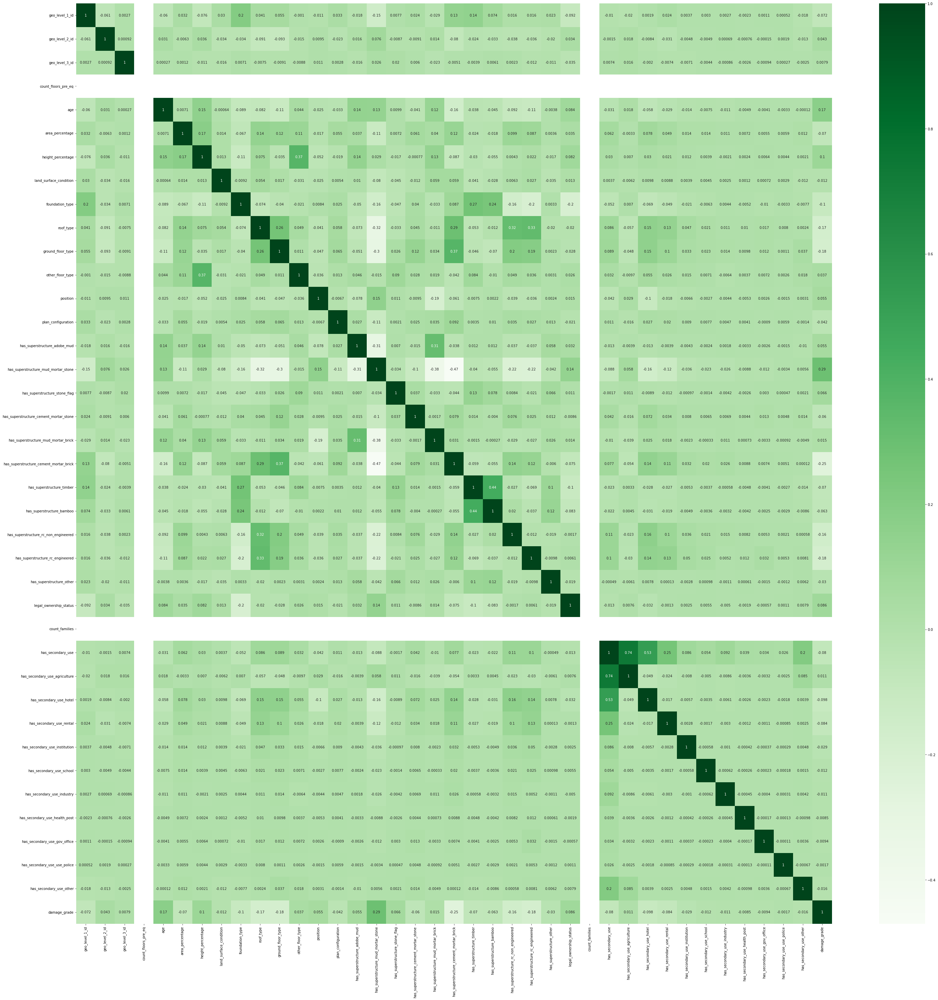

In [43]:
## Checking correlation using heatmap
plt.figure(figsize=(50,50))
sns.heatmap(data.corr(),annot=True,cmap ='Greens')
plt.show()

In [44]:
#these features are not have any relation with the target variable so i droped it
data.drop('count_floors_pre_eq',axis=1,inplace=True)  
data.drop('count_families',axis=1,inplace=True)

In [45]:
data.head()

,geo_level_1_id,geo_level_2_id,geo_level_3_id,age,area_percentage,height_percentage,land_surface_condition,foundation_type,roof_type,ground_floor_type,other_floor_type,position,plan_configuration,has_superstructure_adobe_mud,has_superstructure_mud_mortar_stone,has_superstructure_stone_flag,has_superstructure_cement_mortar_stone,has_superstructure_mud_mortar_brick,has_superstructure_cement_mortar_brick,has_superstructure_timber,has_superstructure_bamboo,has_superstructure_rc_non_engineered,has_superstructure_rc_engineered,has_superstructure_other,legal_ownership_status,has_secondary_use,has_secondary_use_agriculture,has_secondary_use_hotel,has_secondary_use_rental,has_secondary_use_institution,has_secondary_use_school,has_secondary_use_industry,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other,damage_grade
0,-0.983414,-0.518705,1.629055,0.848872,-0.478336,-0.15813,2,2,0,0,1,3,2,1,1,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,3
1,-0.734459,0.481998,-0.945017,-0.607111,0.261917,1.14957,1,2,0,3,1,2,2,0,1,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,2
2,0.883744,-0.819158,0.744612,-0.607111,-0.848463,-0.15813,2,2,0,0,3,3,2,0,1,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,3
3,1.008221,-0.685893,1.216589,-0.607111,-0.478336,-0.15813,2,2,0,0,3,2,2,0,1,0,0,0,0,1,1,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,2
4,-0.361028,-1.381296,-1.308119,0.848872,0.261917,2.45727,2,2,0,0,3,2,2,1,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,3


In [46]:
data.shape

(260601, 37)

# 5. Model Creation

### Spliting The data

In [47]:
## Creating independent and dependent variable
x=data.drop('damage_grade',axis=1)
y=data['damage_grade']

In [48]:
## preparing training and testing data
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=45,test_size=0.25)

In [49]:
print(x_train.shape)# check if data is balanced

print(x_test.shape)

(195450, 36)
(65151, 36)


In [50]:
## Balacing the data

from imblearn.over_sampling import SMOTE #for balancing the data
x_train,y_train=SMOTE().fit_resample(x_train,y_train)#for balancing the data

### 1. Decision Tree

In [51]:
from sklearn.tree import DecisionTreeClassifier #Importing the packages
DT=DecisionTreeClassifier(criterion='entropy', max_depth=10, min_samples_leaf= 2, min_samples_split= 3, splitter= 'random')
DT.fit(x_train,y_train)#fit the training data with the model

DecisionTreeClassifier(criterion='entropy', max_depth=10, min_samples_leaf=2,
                       min_samples_split=3, splitter='random')

In [52]:
y_pred=DT.predict(x_test)  #prediction

In [53]:
#importing all the metrics for evaluation
from sklearn.metrics import f1_score,accuracy_score,classification_report,confusion_matrix

In [54]:
print('accuracy_score:',accuracy_score(y_test,y_pred)) #Evaluation mertics for test data
confusion_matrix(y_test,y_pred)  #it will show you confusion matrix

accuracy_score: 0.5869595247962426


array([[ 4603,  1333,   341],
       [ 7156, 19132, 10821],
       [ 1115,  6144, 14506]], dtype=int64)

In [55]:
print(classification_report(y_test,y_pred))  # it will give precision,recall,f1 scores and accuracy  

              precision    recall  f1-score   support

           1       0.36      0.73      0.48      6277
           2       0.72      0.52      0.60     37109
           3       0.57      0.67      0.61     21765

    accuracy                           0.59     65151
   macro avg       0.55      0.64      0.56     65151
weighted avg       0.63      0.59      0.59     65151



### Random Forest

In [56]:
from sklearn.ensemble import RandomForestClassifier  #Importing the packages
RF=RandomForestClassifier(n_estimators=100,criterion='gini',max_depth=10,min_samples_split=2,min_samples_leaf=3)
RF.fit(x_train,y_train)   #fit the training data with the model

RandomForestClassifier(max_depth=10, min_samples_leaf=3)

In [57]:
y_pred_rf=RF.predict(x_test)  #predict with test data

In [58]:
print('accuracy_score:',accuracy_score(y_test,y_pred_rf)) #Evaluation mertics for test data
confusion_matrix(y_test,y_pred_rf)

accuracy_score: 0.5964912280701754


array([[ 4193,  1475,   609],
       [ 5022, 18849, 13238],
       [  604,  5341, 15820]], dtype=int64)

In [59]:
print(classification_report(y_test,y_pred_rf))   # it will give precision,recall,f1 scores and accuracy 

              precision    recall  f1-score   support

           1       0.43      0.67      0.52      6277
           2       0.73      0.51      0.60     37109
           3       0.53      0.73      0.62     21765

    accuracy                           0.60     65151
   macro avg       0.56      0.63      0.58     65151
weighted avg       0.64      0.60      0.60     65151



**I am getting very low accuracy so i will go for hyper parameter tuning with GridsearchCV**

# **Hyperparameter Tuning**


n_estimators = number of trees in the foreset

max_features =These are the maximum number of features Random Forest is allowed to try in individual tree. There are multiple options available in Python to assign maximum features

max_depth =The depth of each tree in the forest. The deeper the tree, the more splits it has and it captures more information about the data

min_samples_split =the minimum number of samples required to split an internal node. This can vary between considering at least one sample at each node to considering all of the samples at each node

min_samples_leaf = minimum number of data points allowed in a leaf node

bootstrap = method for sampling data points (with or without replacement)

In [60]:
from sklearn.model_selection import RandomizedSearchCV
n_estimators = [10, 150, 300]       #Number of decision trees
max_features = ['log2', 'sqrt']                                  #maximum number of features allowed to try in individual tree
max_depth = [30, 60, 90, None]      #List Comprehension-using for loop in list
max_depth.append(None)
min_samples_split = [2,3,5]#minimum number of samples required to split an internal node
min_samples_leaf = [1, 2, 4]#minimum number of samples required to be at a leaf node.
bootstrap = [True, False]#sampling 


grid = {'n_estimators': n_estimators, 'max_features': max_features,
               'max_depth': max_depth, 'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf, 'bootstrap': bootstrap}

RFC=RandomForestClassifier(random_state=48)

rf_random=RandomizedSearchCV(estimator=RFC,param_distributions=grid,scoring="f1", n_iter=100,n_jobs=-1, verbose=1, cv=3)

In [61]:
rf_random.fit(x_train,y_train) #fit with traing data for train the model

Fitting 3 folds for each of 100 candidates, totalling 300 fits


RandomizedSearchCV(cv=3, estimator=RandomForestClassifier(random_state=48),
                   n_iter=100, n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [30, 60, 90, None, None],
                                        'max_features': ['log2', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 3, 5],
                                        'n_estimators': [10, 150, 300]},
                   scoring='f1', verbose=1)

In [62]:
rf_random.best_params_  #it gives best parameters for the better result

{'n_estimators': 150,
 'min_samples_split': 3,
 'min_samples_leaf': 2,
 'max_features': 'sqrt',
 'max_depth': 60,
 'bootstrap': False}

In [68]:
RFT=RandomForestClassifier(n_estimators=150,min_samples_split=3,min_samples_leaf=2,max_features='sqrt',max_depth=60,bootstrap=False)
RFT.fit(x_train,y_train)   #Fit with the best parameters

RandomForestClassifier(bootstrap=False, max_depth=60, max_features='sqrt',
                       min_samples_leaf=2, min_samples_split=3,
                       n_estimators=150)

In [69]:
y_pred_rf=RFT.predict(x_test)

In [70]:
print('accuracy_score:',accuracy_score(y_test,y_pred_rf)) #Evaluation mertics for test data
confusion_matrix(y_test,y_pred_rf)   

accuracy_score: 0.7138800632377094


array([[ 3653,  2479,   145],
       [ 2435, 28838,  5836],
       [  251,  7495, 14019]], dtype=int64)

In [71]:
print(classification_report(y_test,y_pred_rf))   # it will give precision,recall,f1 scores and accuracy 

              precision    recall  f1-score   support

           1       0.58      0.58      0.58      6277
           2       0.74      0.78      0.76     37109
           3       0.70      0.64      0.67     21765

    accuracy                           0.71     65151
   macro avg       0.67      0.67      0.67     65151
weighted avg       0.71      0.71      0.71     65151



### KNN

In [63]:
from sklearn.neighbors import KNeighborsClassifier    # Using KNN algo for predicition
knn=KNeighborsClassifier(n_neighbors=7)
knn.fit(x_train,y_train)

KNeighborsClassifier(n_neighbors=7)

In [64]:
y_pred_knn=knn.predict(x_test)

In [65]:
print('accuracy_score:',accuracy_score(y_test,y_pred_knn)) #Evaluation mertics for test data
confusion_matrix(y_test,y_pred_knn)

accuracy_score: 0.5675737901183404


array([[ 4615,  1132,   530],
       [ 7154, 18394, 11561],
       [ 1742,  6054, 13969]], dtype=int64)

In [66]:
print(classification_report(y_test,y_pred_knn))   # it will give precision,recall,f1 scores and accuracy 

              precision    recall  f1-score   support

           1       0.34      0.74      0.47      6277
           2       0.72      0.50      0.59     37109
           3       0.54      0.64      0.58     21765

    accuracy                           0.57     65151
   macro avg       0.53      0.62      0.55     65151
weighted avg       0.62      0.57      0.57     65151



### SVC

In [72]:
from sklearn.svm import SVC  #Try with SVC algo for prediciton
SVC=SVC()

In [73]:
SVC.fit(x_train,y_train)

SVC()

In [75]:
y_pred_svc=SVC.predict(x_test)

In [76]:
print('accuracy_score:',accuracy_score(y_test,y_pred_svc)) #Evaluation mertics for test data
confusion_matrix(y_test,y_pred_svc)

accuracy_score: 0.5571978941228838


array([[ 4151,  1207,   919],
       [ 5239, 16273, 15597],
       [  804,  5083, 15878]], dtype=int64)

In [77]:
print(classification_report(y_test,y_pred_svc))   # it will give precision,recall,f1 scores and accuracy 

              precision    recall  f1-score   support

           1       0.41      0.66      0.50      6277
           2       0.72      0.44      0.55     37109
           3       0.49      0.73      0.59     21765

    accuracy                           0.56     65151
   macro avg       0.54      0.61      0.55     65151
weighted avg       0.61      0.56      0.56     65151



# Conclusion


### I have tried Decision Tree , Random forest, KNN, SVC and with their hyper parameters for that aswell.
### The Random Forest gives best Accuracy with 71.38 score.

### So, Random forest classifier is the best model for this Earth quake multi class classification dataset.




# Thank You.